In [1]:
import scanpy as sc
from tidyverse.dummy import *
from sctools import pipeline
from sctools.de import gene_expression_to_flat_df_NEW, scanpy_DE_to_dataframe_fast, get_de_genes
# import scHCLpy.adata
from crukiopy_release.datatools import read_metadata
from sctools.scplotting import recolor, kneeplot_split
from crukiopy_release.colormaps import celltype_order_coarse_celltype, color_dict_diagnosis, cmap_subtypes
import gc
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz
from sccoda.util import comp_ana as mod
from cellprop_utils import plot_patient_diagnosis

from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('svg')
set_matplotlib_formats('png')

from sctools.composition import clustered_heatmap_from_sccoda_CLR, compositional_pca, plot_pca_loadings

Importing tidyverse


# Creating data

the original full dataset is located here:
```gsutil -m cp gs://cruk-adata-for-cellbrowser/Aug2022_adata/Atlas/Eso_Atlas.h5ad .```

In [2]:
adata = sc.read_h5ad('/home/mstrasse/TB4/Aug2022_adata/Atlas/Eso_Atlas.h5ad')
adata = adata[adata.obs.doublet_score<0.2]
adata = adata[adata.obs.percent_mito<0.1]

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


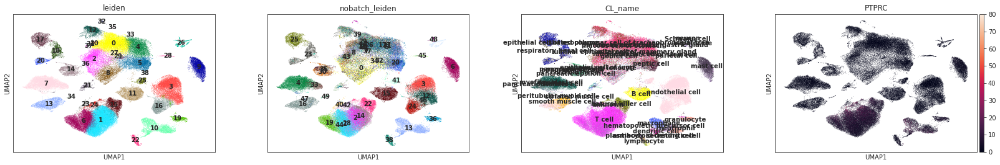

In [3]:
sc.pl.umap(adata, color=['leiden', 'nobatch_leiden', 'CL_name', 'PTPRC'], legend_loc='on data')

In [4]:
adata = adata[adata.obs.leiden.isin(["6", '1', '15','23','24'])]

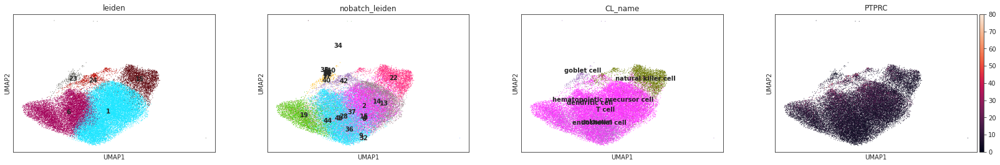

In [5]:
sc.pl.umap(adata, color=['leiden', 'nobatch_leiden', 'CL_name', 'PTPRC'], legend_loc='on data')

In [ ]:
A = sc.AnnData(adata.X, var=adata.var, obs=adata.obs)
A.raw = A
A.obs['original_leiden'] = adata.obs['leiden']
A = pipeline.michi_kallisto_recipe(A,  harmony_correction='samplename')
pipeline.differential_expression_michi_kallisto_recipe(A, 'leiden')

In [13]:
# A.write_h5ad('/home/mstrasse/TB4/cellTypeProportions/Tcell_processed.h5ad')

# Analysis

In [4]:
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/Tcell_processed.h5ad')
# fixing some diagnosis
from crukiopy_release.datatools import fix_diagnosis, diagnosis_fix_dict
A = fix_diagnosis(A)
A.obs.diagnosis = pd.Categorical(A.obs.diagnosis)
recolor(A, 'diagnosis', color_dict_diagnosis)    

df_meta = read_metadata()

# again fix diagnosis in those samples
df_meta = df_meta[df_meta.samplename.isin(A.obs.samplename.unique())].set_index('samplename').sort_values('diagnosis')
for s, d in diagnosis_fix_dict.items():
    df_meta.loc[s, 'diagnosis'] = d

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'sample_diagnosis' as categorical


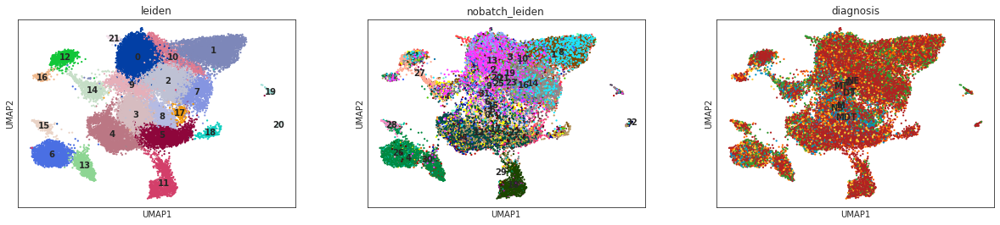

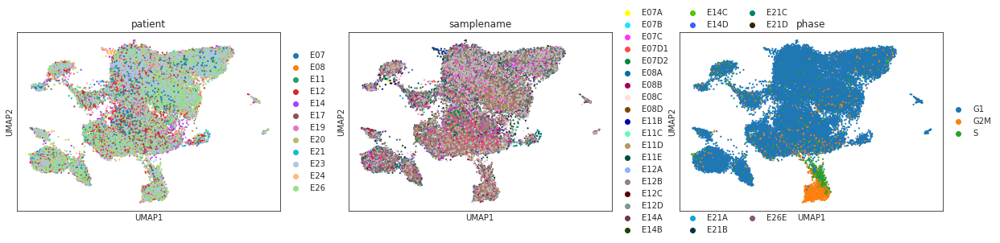

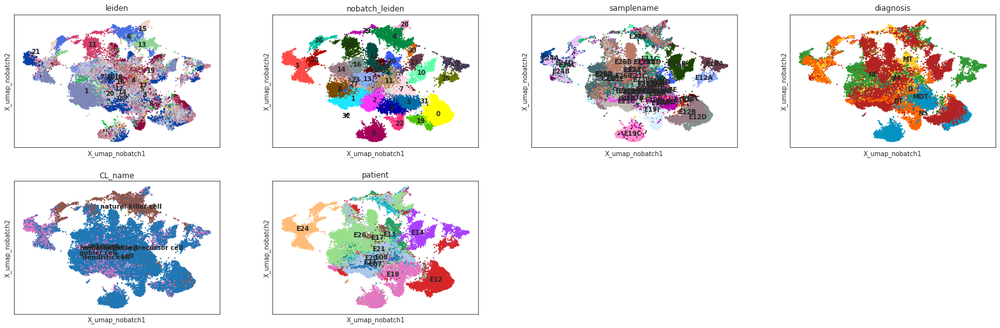

In [5]:
sc.pl.umap(A, color=['leiden', 'nobatch_leiden', 'diagnosis'], legend_loc='on data', size=20)
sc.pl.umap(A, color=['patient', 'samplename', 'phase'], size=20)

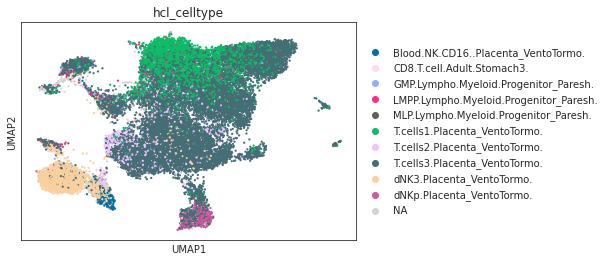

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


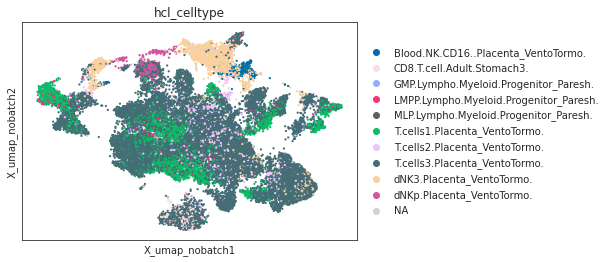

In [6]:
sc.pl.umap(A, color=['hcl_celltype'], size=20, groups=A.obs.hcl_celltype.value_counts().head(10).index.tolist())

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


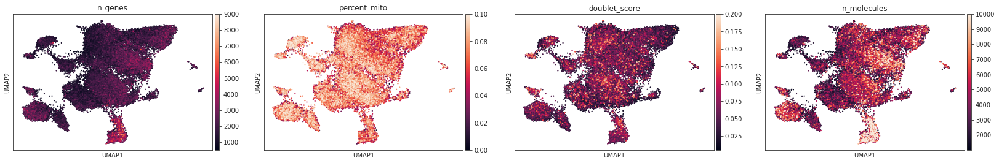

In [7]:
sc.pl.umap(A, color=['n_genes', 'percent_mito', 'doublet_score', 'n_molecules'], legend_loc='on data', size=20, vmax=[9000, 0.1, 0.2, 10000])

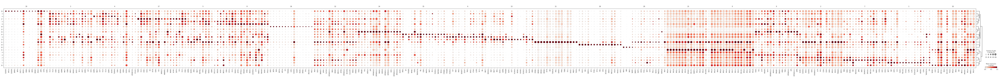

In [8]:
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', n_genes=15)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


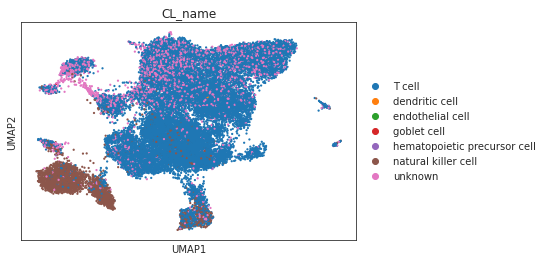

In [9]:
sc.pl.umap(A, color=['CL_name'], size=20)

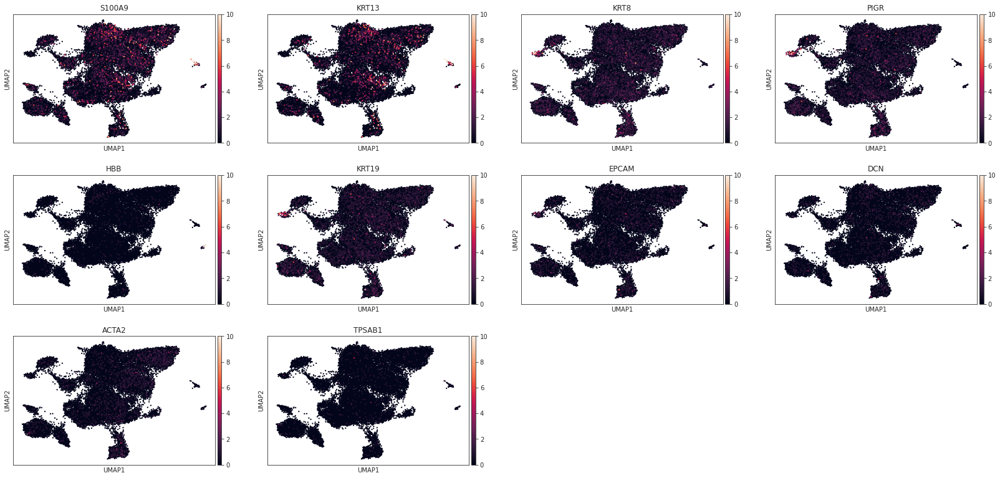

In [10]:
sc.pl.umap(A, color=['S100A9','KRT13', 'KRT8', 'PIGR', 'HBB', 'KRT19', 'EPCAM', 'DCN', 'ACTA2', 'TPSAB1'], legend_loc='on data', size=20, vmax=10)

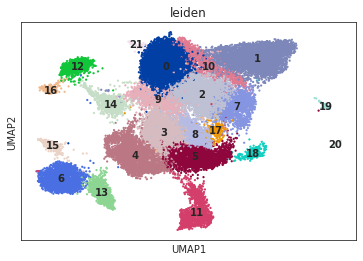

In [11]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)

In [12]:
doublets = [
    '16',  # KRT expressing
    '19','20', # HBB, Macrohpage stuff
]

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/home/mstrasse/miniconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.


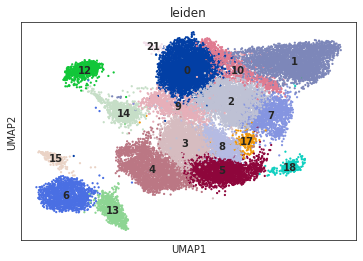

In [13]:
A = A[~A.obs.leiden.isin(doublets)]
A = A[A.obs.diagnosis.isin(['NE', 'NS', 'M','D','T'])]

# dibvinding
A = A[~A.obs.leiden.isin(['11'])]

sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)

# recluster

In [15]:
if 'leiden_backup' not in A.obs.columns:
    A.obs['leiden_backup'] = A.obs.leiden
sc.tl.leiden(A, resolution=0.6)
pipeline.differential_expression_michi_kallisto_recipe(A, groupby='leiden')

Trying to set attribute `.obs` of view, copying.
12/18/2022 06:27:14 AM doing csr->csc
12/18/2022 06:27:14 AM done csr->csc
/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
12/18/2022 06:27:55 AM doing csc->csr
12/18/2022 06:27:56 AM done csc->csr
12/18/2022 06:27:56 AM Filtering DE
12/18/2022 06:27:57 AM Done Filtering DE


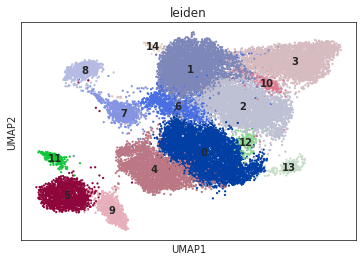

In [16]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)

# some charaterization of the clusters

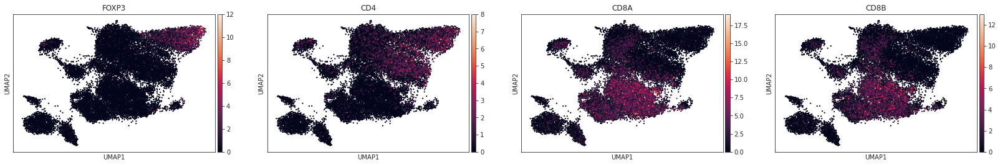

In [16]:
sc.pl.umap(A, color=['FOXP3', 'CD4','CD8A','CD8B'], size=20)

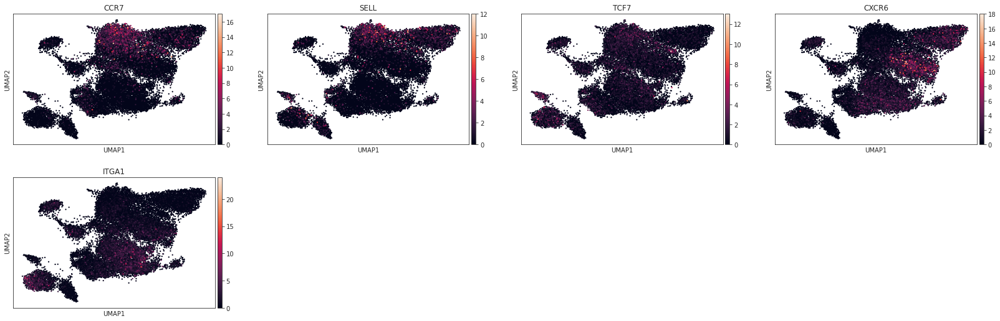

In [18]:
sc.pl.umap(A, color=['CCR7', 'SELL', 'TCF7'] + ['CXCR6', 'ITGA1'], legend_loc='on data', size=20)

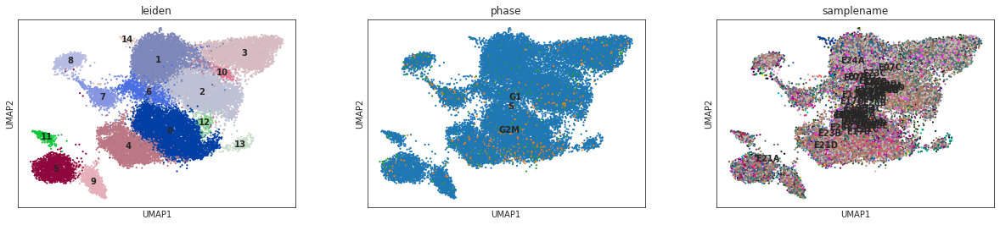

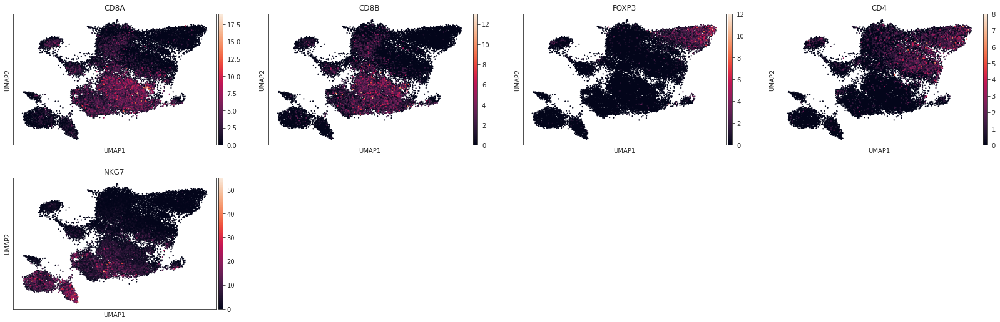

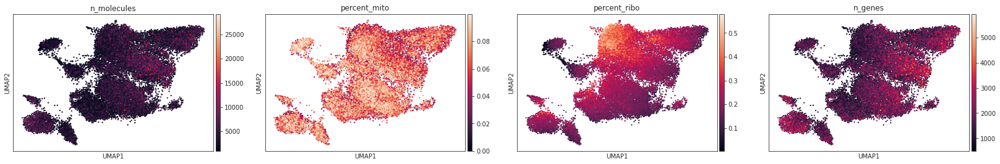

In [19]:
sc.pl.umap(A, color=['leiden', 'phase', 'samplename'], legend_loc='on data', size=20)
sc.pl.umap(A, color=['CD8A', 'CD8B', 'FOXP3', 'CD4', 'NKG7'], legend_loc='on data', size=20)
sc.pl.umap(A, color=['n_molecules', 'percent_mito', 'percent_ribo', 'n_genes'], legend_loc='on data', size=20)

In [17]:
sc.tl.dendrogram(A, groupby='leiden')

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 9, etc.


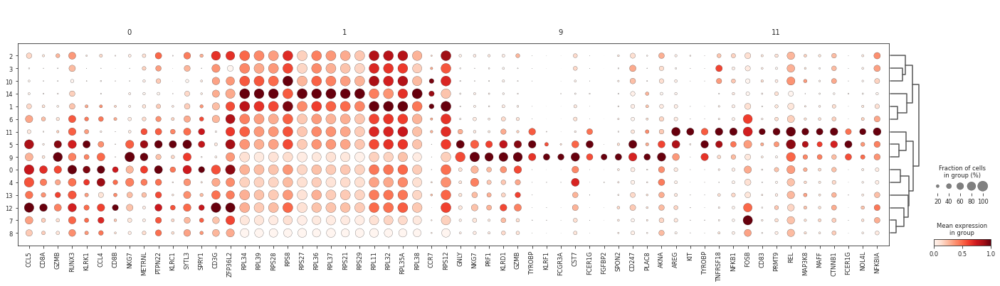

In [18]:
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', n_genes=15, groups=['0','1','9','11'])

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


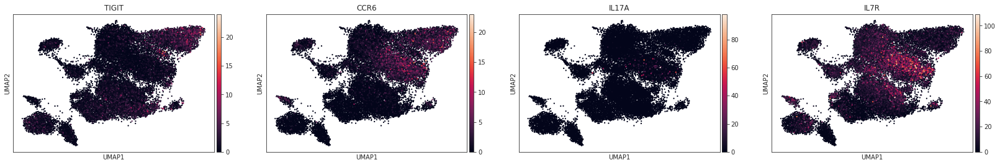

In [19]:
sc.pl.umap(A, color=['TIGIT', 'CCR6', 'IL17A', 'IL7R'], legend_loc='on data', size=20)

# NK
- NK cells should be NCAM1 (CD57) positive
- CD3 neg
- FCGR3 pos
- CD57 (B3GAT1) pos
- NCR1 pos


/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


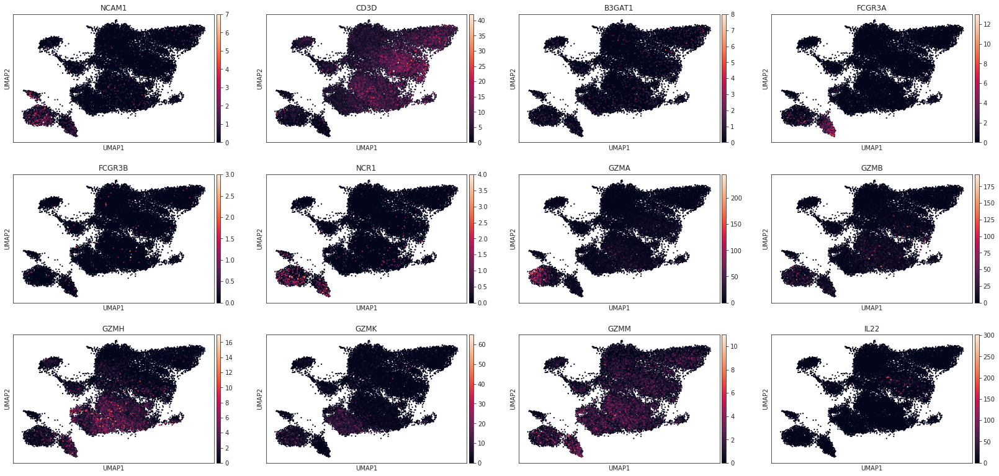

In [22]:
sc.pl.umap(A, color=['NCAM1', 'CD3D', 'B3GAT1','FCGR3A', 'FCGR3B', 'NCR1', 'GZMA', 'GZMB','GZMH','GZMK', 'GZMM', 'IL22'], legend_loc='on data', size=20)

# Treg
- IL2RA 
- also CD4 (Tregs are derived from Thelper)
- FOXP3

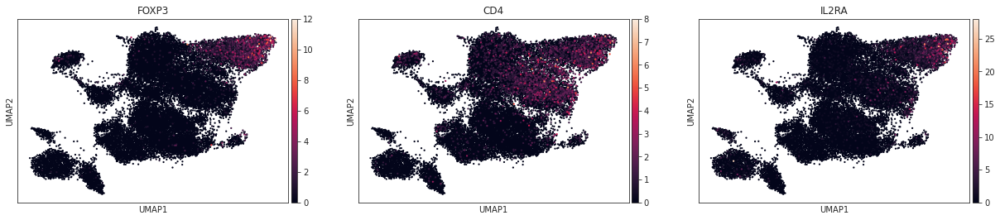

In [23]:
sc.pl.umap(A, color=['FOXP3', 'CD4', 'IL2RA'], legend_loc='on data', size=20)

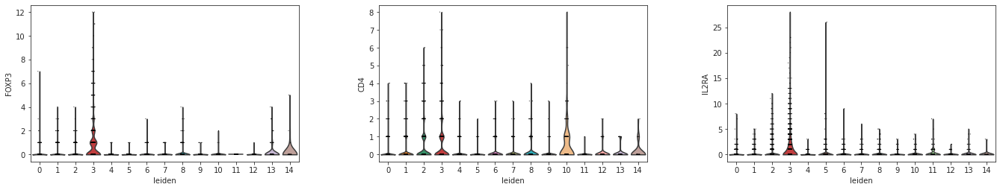

In [24]:
sc.pl.violin(A, keys=['FOXP3', 'CD4', 'IL2RA'], groupby='leiden')

In [8]:
coarse_labels = {
    '3': 'Treg',
    '2': 'CD4+',
    '1': 'CD4+',
    '10':'CD4+',
    
    '0': 'CD8+',
    '4': 'CD8+',
    '6': 'CD8+',
    '12': 'CD8+',
    '7': 'other1',
    '8': 'other2',
    '13': 'other3',
    '14': 'other4',
    '5': 'NK1',
    '9': 'NK2',
    '11': 'NK3',
}

A.obs['annotation'] = A.obs.leiden.apply(lambda x: coarse_labels[x])

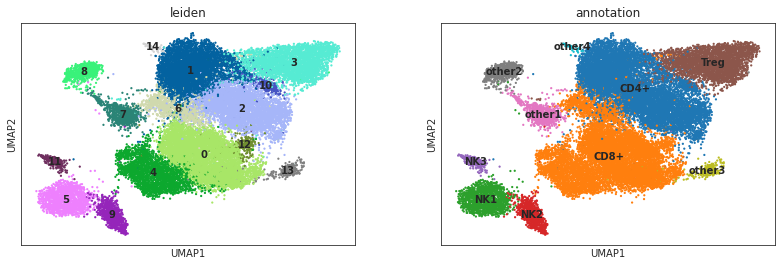

In [29]:
sc.pl.umap(A, color=['leiden', 'annotation'], legend_loc='on data', size=20, vmax=10)

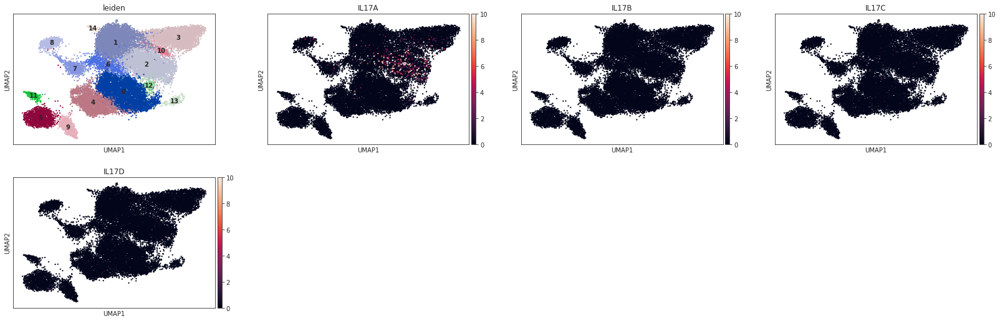

In [25]:
sc.pl.umap(A, color=['leiden', 'IL17A', 'IL17B','IL17C','IL17D'], legend_loc='on data', size=20, vmax=10)

# SCCODA
### on the clusters

In [2]:
!mkdir /tmp/proportions

mkdir: cannot create directory ‘/tmp/proportions’: File exists


In [2]:
plotfolder = '/tmp/proportions/Tcell_proportions/'
import os 
if not os.path.exists(plotfolder):
    os.mkdir(plotfolder, )

In [3]:
cluster_name = 'leiden'
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/Tcell_processed.h5ad')
from crukiopy_release.datatools import fix_diagnosis, diagnosis_fix_dict
A = fix_diagnosis(A)
A.obs.diagnosis = pd.Categorical(A.obs.diagnosis)
recolor(A, 'diagnosis', color_dict_diagnosis)    

df_meta = read_metadata()

# again fix diagnosis in those samples
df_meta = df_meta[df_meta.samplename.isin(A.obs.samplename.unique())].set_index('samplename').sort_values('diagnosis')
for s, d in diagnosis_fix_dict.items():
    df_meta.loc[s, 'diagnosis'] = d

In [4]:
a_tmp = A

data_scanpy_1 = dat.from_scanpy(
    a_tmp,
    cell_type_identifier=cluster_name,
    sample_identifier="samplename",
    covariate_df=df_meta[df_meta.index.isin(A.obs.samplename.unique())]
)
print(data_scanpy_1)

AnnData object with n_obs × n_vars = 49 × 15
    obs: 'foldername', 'patient', 'sequencer', 'tissue', 'flowcell', 'procedure', 'diagnosis', 'treatment', 'phantompurger_folder', 'cruk_sample', 'atlas_sample', 'R2length', 'gender'
    var: 'n_cells'


In [5]:
diagnosis_ordered = ['NE', 'M','D','T', 'NS']

In [6]:
# need to extend cmap by one
from crukiopy_release.colormaps import cmap_subtypes, ListedColormap
cmap_subtypes = ListedColormap(cmap_subtypes.colors + ['lightgrey'])

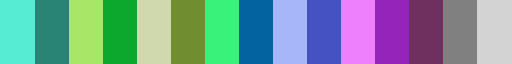

In [7]:
cmap_subtypes

In [8]:
cluster_order = A.obs[cluster_name].cat.categories
cluster_order = [
    '1','2','10', # tH
    '3', #Treg
    '0','4','6','12', # cytoT
    '5','9','11',  # NK
    '7','8','13','14' # other
]

In [9]:
cmap_subtypes = ListedColormap(np.array(cmap_subtypes.colors)[[7,8,9, # TH
                                              0,
                                              2,3,4,5,
                                              10,11,12,
                                              1,6,13,14
                                             ]])

In [10]:
leiden_color_dict = dict(zip(cluster_order, cmap_subtypes.colors ))
_tmp = [leiden_color_dict[c] for c in A.obs.leiden.cat.categories]

if not 'leiden_colors_backup' in A.uns:
    A.uns['leiden_colors_backup']= A.uns['leiden_colors']
A.uns['leiden_colors'] = _tmp

In [11]:
# # note: need to write the full 35k genes! .to_adata() neatly pulls that out of .raw and applies any other attributes from teh original adata
# B = A.raw.to_adata()
# B.uns = A.uns
# B.obsm = A.obsm
# B.obsp= A.obsp
# B.write_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/Tcell_processed.h5ad')

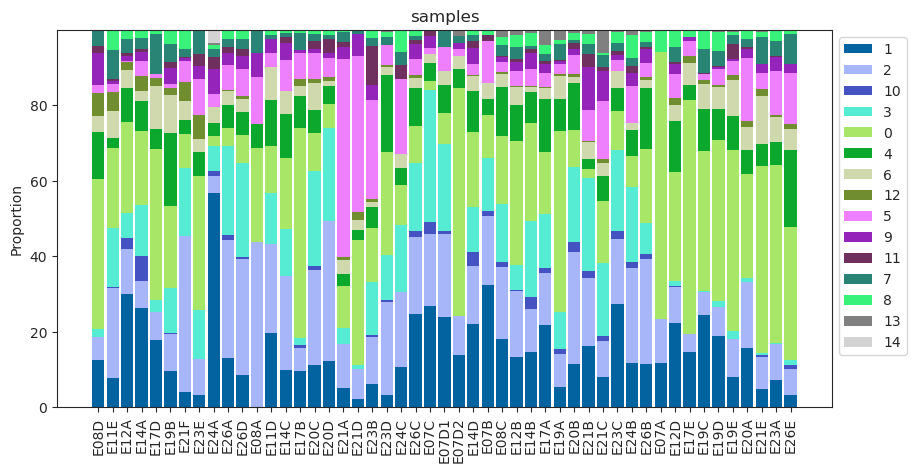

In [13]:
order = []
_snames = data_scanpy_1.obs.index.unique()
for d in diagnosis_ordered:
    order.extend(sorted(df_meta.query('samplename in @_snames and diagnosis==@d').index))

set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="samples", figsize=(10,5), level_order=order, cmap=cmap_subtypes)
plt.xticks(rotation=90);
fig.figure.savefig(f'{plotfolder}/Tcell_proportions_per_sample.svg')
set_matplotlib_formats('png')

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'sample_diagnosis' as categorical


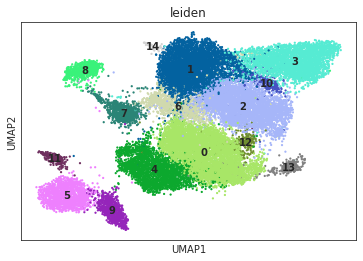

In [21]:
set_matplotlib_formats('png')
sc.pl.umap(A, color=[cluster_name], legend_loc='on data', size=20, show=False)
plt.savefig(f'{plotfolder}/Tcell_umap.svg')
plt.savefig(f'{plotfolder}/Tcell_umap.png')

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


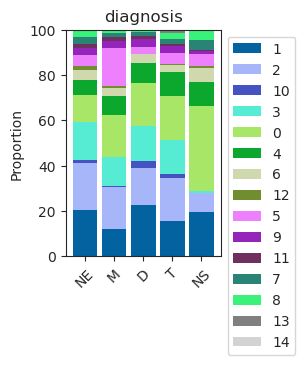

In [22]:
set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="diagnosis", level_order=diagnosis_ordered, cmap=cmap_subtypes, figsize=(2,3))
fig.figure.savefig(f'{plotfolder}/Tcell_proportions_per_diagnosis.svg')
set_matplotlib_formats('png')

In [71]:
set_matplotlib_formats('png')

In [23]:
q = pd.crosstab(
    pd.Series(pd.Categorical(A.obs[cluster_name], categories=cluster_order), name=cluster_name, index=A.obs[cluster_name].index),
    A.obs.diagnosis
)
norm_freqs = q.div( q.sum(1), axis=0)
norm_freqs = norm_freqs.unstack().reset_index().rename({0:'frequency'}, axis=1)
norm_freqs.diagnosis = pd.Categorical(norm_freqs.diagnosis, categories=diagnosis_ordered)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 3 x 2 in image.
/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /tmp/proportions/Tcell_proportions//Tcell_proportions_per_cluster.svg


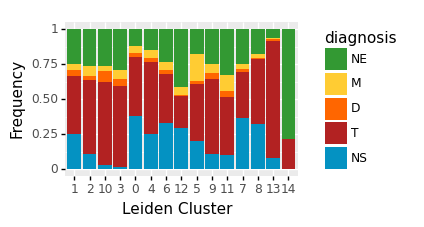

<ggplot: (8779112715617)>

In [25]:
set_matplotlib_formats('svg')
p = pn.ggplot(
    norm_freqs,
    pn.aes(x='leiden', y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(3,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.labs(x='Leiden Cluster', y='Frequency')

p.save(f'{plotfolder}/Tcell_proportions_per_cluster.svg')
set_matplotlib_formats('png')
p

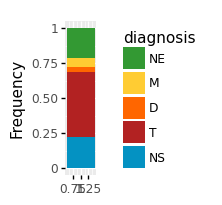

<ggplot: (8734231492925)>

In [75]:
overall_props = A.obs.diagnosis.value_counts()
overall_props = overall_props/overall_props.sum()
overall_props = overall_props.loc[diagnosis_ordered]

_ddd = pd.DataFrame(overall_props).reset_index().rename({'index': 'diagnosis','diagnosis': 'frequency'}, axis=1)
_ddd.diagnosis = pd.Categorical(_ddd.diagnosis, categories=diagnosis_ordered)

pn.ggplot(
    _ddd,
    pn.aes(x=1, y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(7,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.theme(figure_size=(0.4,2)) + pn.labs(x='', y='Frequency')

# MCMC

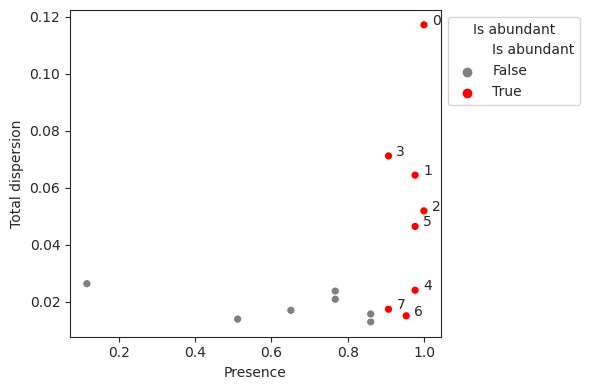

In [76]:
viz.rel_abundance_dispersion_plot(
    data=data_scanpy_1,
    abundant_threshold=0.9)
plt.show()

In [77]:
model_salm = mod.CompositionalAnalysis(data_scanpy_1, formula="C(diagnosis, Treatment('NE')) + procedure+ patient", reference_cell_type="4") 

# Run MCMC
sim_results = model_salm.sample_hmc(num_results=3*20000)

Zero counts encountered in data! Added a pseudocount of 0.5.


100%|██████████| 60000/60000 [05:02<00:00, 198.29it/s]


MCMC sampling finished. (329.772 sec)
Acceptance rate: 39.2%


In [ ]:
import arviz as az

az.plot_trace(
    sim_results,
    divergences=False,
    var_names=["alpha", "beta"],
    coords={"cell_type": sim_results.posterior.coords["cell_type_nb"]},
)
plt.show()

In [78]:
scCODA_result = sim_results.effect_df
scCODA_result[sim_results.effect_df['Final Parameter'] != 0]

Final Parameter  HDI 3%  \
Covariate                           Cell Type                            
C(diagnosis, Treatment('NE'))[T.NS] 0                 1.062977   0.771   
                                    3                -1.875126  -2.469   

                                               HDI 97%     SD  \
Covariate                           Cell Type                   
C(diagnosis, Treatment('NE'))[T.NS] 0            1.385  0.161   
                                    3           -1.249  0.326   

                                               Inclusion probability  \
Covariate                           Cell Type                          
C(diagnosis, Treatment('NE'))[T.NS] 0                            1.0   
                                    3                            1.0   

                                               Expected Sample  \
Covariate                           Cell Type                    
C(diagnosis, Treatment('NE'))[T.NS] 0               236.527771   
                                    3                 9.534936   

                                               log2-fold change  
Covariate                           Cell Type                    
C(diagnosis, Treatment('NE'))[T.NS] 0                  1.244981  
                                    3                 -2.993806

In [79]:
_q = scCODA_result.reset_index()
a = pd.crosstab(_q['Covariate'].replace({
    "C(diagnosis, Treatment('NE'))[T.D]": 'D',
    "C(diagnosis, Treatment('NE'))[T.M]": 'M',
    "C(diagnosis, Treatment('NE'))[T.T]": 'T',
    "C(diagnosis, Treatment('NE'))[T.NS]": 'NS',
    "procedure[T.resection]": 'resection'
    }),
    _q['Cell Type'], 
    values=_q['log2-fold change']* (_q['Final Parameter'] !=0), aggfunc=np.mean).replace({np.nan: 0})

Text(6.0, 0.5, '')

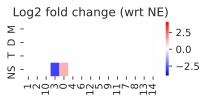

In [80]:
set_matplotlib_formats('svg')
fig, ax = plt.subplots(figsize=(3, 1))
sns.heatmap(a.loc[['M','D','T','NS'], cluster_order], cmap=plt.cm.bwr, vmin=-4, vmax=4, xticklabels=True)
plt.title('Log2 fold change (wrt NE)')
plt.xlabel(None)
plt.ylabel(None)

Text(6.0, 0.5, '')

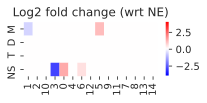

In [113]:
set_matplotlib_formats('svg')
fig, ax = plt.subplots(figsize=(3, 1))
sns.heatmap(a.loc[['M','D','T','NS'], cluster_order], cmap=plt.cm.bwr, vmin=-4, vmax=4, xticklabels=True)
plt.title('Log2 fold change (wrt NE)')
plt.xlabel(None)
plt.ylabel(None)

In [ ]:
fig.savefig(f'{plotfolder}/Tcell_scCODA.svg')

In [114]:
set_matplotlib_formats('png')

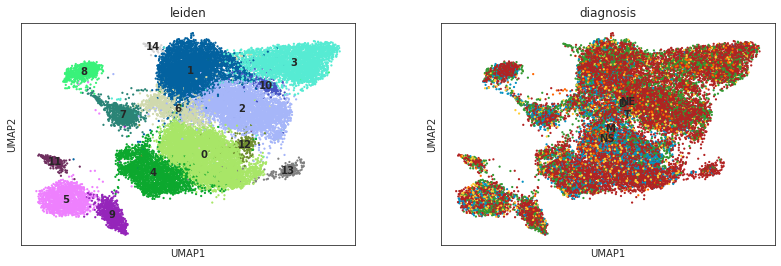

In [24]:
sc.pl.umap(A, color=['leiden', 'diagnosis'], legend_loc='on data', size=20)

# Markers 

In [ ]:
from sctools.pipeline import differential_expression_michi_kallisto_recipe
differential_expression_michi_kallisto_recipe(A, groupby='leiden', min_in_group_fraction=0.5, max_out_group_fraction=0.5)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


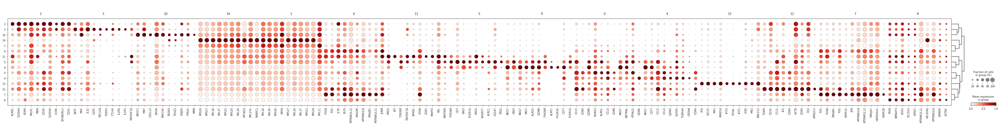

In [27]:
sc.tl.dendrogram(A, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var')

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'sample_diagnosis' as categorical


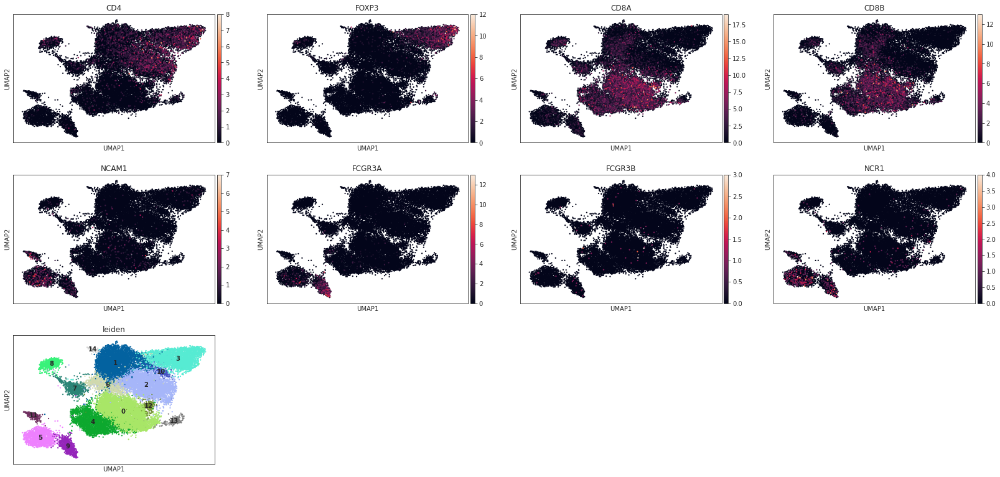

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


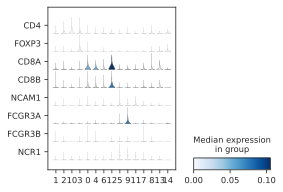

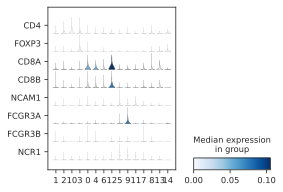

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


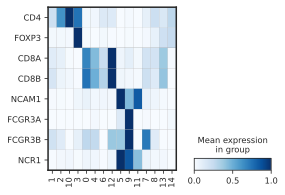

In [15]:
genes =['CD4',
       'FOXP3',
        'CD8A','CD8B',
        #NK
        'NCAM1','FCGR3A', 'FCGR3B', 'NCR1', #  'B3GAT1',
        #'LAG3', 'CD244', 'CCL5', 'CXCL9', 'CXCL13', 'MSR1', 'CSF3R', 'CYBB','KLRK1'
]
set_matplotlib_formats('png')
sc.pl.umap(A, color=genes+['leiden'], legend_loc='on data', size=20)

B = A.copy()
B.obs['leiden'] = pd.Categorical(B.obs['leiden'], categories=cluster_order)
set_matplotlib_formats('svg')
sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True,show=False,  #order=cluster_order
                figsize=(4,3))
plt.savefig(f'{plotfolder}/Tcell_markers.svg')

sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, use_raw=False,  #order=cluster_order
                figsize=(4,3))

sc.pl.matrixplot(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(4,3), cmap='Blues')
plt.savefig(f'{plotfolder}/Tcell_markers_matrix.svg')